In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import pandas as pd
import string
import matplotlib.pyplot as plt

from keras.preprocessing.sequence import pad_sequences
from google.colab.patches import cv2_imshow

from keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional
from keras.models import Model
from keras.activations import relu, sigmoid, softmax
import keras.backend as K

#from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from PIL import Image

import tensorflow as tf

#ignore warnings in the output
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)


In [ ]:
def crop_and_split(img):
    if isinstance(img, str):
        img = cv2.imread(img)
        assert img is not None

    img = img[:, 200:]

    prt = img[:600]
    hand = img[650:2500]
    return hand, prt

hand, prt = crop_and_split('/a01-000u.png')
_, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(hand)
ax2.imshow(prt)
plt.show()
plt.close()

AssertionError: ignored

In [ ]:
def process_image(img):
    """
    Converts image to shape (32, 128, 1) & normalize
    """
    w, h = img.shape

#     _, img = cv2.threshold(img,
#                            128,
#                            255,
#                            cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    # Aspect Ratio Calculation
    new_w = 32
    new_h = int(h * (new_w / w))
    img = cv2.resize(img, (new_h, new_w))
    w, h = img.shape

    img = img.astype('float32')

    # Converts each to (32, 128, 1)
    if w < 32:
        add_zeros = np.full((32-w, h), 255)
        img = np.concatenate((img, add_zeros))
        w, h = img.shape

    if h < 128:
        add_zeros = np.full((w, 128-h), 255)
        img = np.concatenate((img, add_zeros), axis=1)
        w, h = img.shape

    if h > 128 or w > 32:
        dim = (128,32)
        img = cv2.resize(img, dim)

    img = cv2.subtract(255, img)

    img = np.expand_dims(img, axis=2)

    # Normalize
    img = img / 255

    return img

In [ ]:
img=hand

In [ ]:
img = cv2.imread('/content/a01-000u.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

h, w, c = img.shape

if w > 1000:

    new_w = 1000
    ar = w/h
    new_h = int(new_w/ar)

    img = cv2.resize(img, (new_w, new_h), interpolation = cv2.INTER_AREA)
plt.imshow(img);

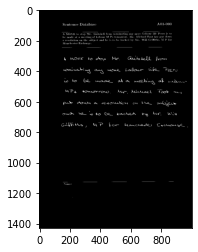

In [ ]:
def thresholding(image):
    img_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    ret,thresh = cv2.threshold(img_gray,80,255,cv2.THRESH_BINARY_INV)
    plt.imshow(thresh, cmap='gray')
    return thresh

thresh_img = thresholding(img);

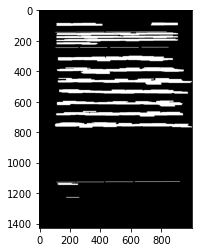

In [ ]:
#dilation
kernel = np.ones((3,85), np.uint8)
dilated = cv2.dilate(thresh_img, kernel, iterations = 1)
plt.imshow(dilated, cmap='gray');

In [ ]:
(contours, heirarchy) = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
sorted_contours_lines = sorted(contours, key = lambda ctr : cv2.boundingRect(ctr)[1]) # (

In [ ]:
img2 = img.copy()

for ctr in sorted_contours_lines:

    x,y,w,h = cv2.boundingRect(ctr)
    cv2.rectangle(img2, (x,y), (x+w, y+h), (40, 100, 250), 2)

cv2_imshow(img2);

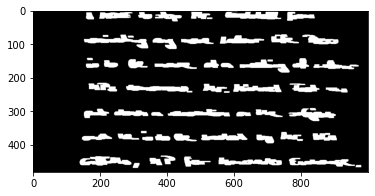

In [ ]:
#dilation
kernel = np.ones((3,15), np.uint8)
dilated2 = cv2.dilate(thresh_img, kernel, iterations = 1)
plt.imshow(dilated2, cmap='gray');

In [ ]:
img2 = img.copy()

for ctr in sorted_contours_lines:

    x,y,w,h = cv2.boundingRect(ctr)
    cv2.rectangle(img2, (x,y), (x+w, y+h), (40, 100, 250), 2)

plt.imshow(img2);

In [ ]:
# 01
# 02
# 03
# 00

# 10
# 12
# 13
# 10

# 21
# 20
# 23
# 20

# 31
# 30
# 32
# 33

In [ ]:
import math

In [ ]:
sorted_contours_lines

In [ ]:
img3 = img.copy()
words_list = []

for line in sorted_contours_lines:

    # roi of each line
    x, y, w, h = cv2.boundingRect(line)
    roi_line = dilated2[y:y+w, x:x+w]

    # draw contours on each word
    (cnt, heirarchy) = cv2.findContours(roi_line.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    sorted_contour_words=sorted(cnt[0])
    #sorted_contour_words=sorted(cnt,key=lambda data:math.sqrt((data[0]**2)+(data[1]**2)))
    #contours.sort(key=lambda r: (int(nearest * round(float(r[1])/nearest)) * max_width + r[0]))    # max_width = max(contours, key=lambda r: r[0] + r[2])[0]
    # max_height = max(contours, key=lambda r: r[3])[3]
    # nearest = max_height * 1.4
    # sorted_contour_words=contours.sort(key=lambda r: (int(nearest * round(float(r[1])/nearest)) * max_width + r[0]))
    #sorted_contour_words = sorted(cnt, key=lambda cntr : ( (  int(cv2.boundingRect(cntr)[1])*0.2) * (int(cv2.boundingRect(cntr)[0])*0.2)) )
    #sorted_contour_words = sorted(cnt, key=lambda cntr : (cv2.boundingRect(cntr)[1]))
    #print(sorted_contour_words)

    for word in sorted_contour_words:

        if cv2.contourArea(word) < 400:
            continue

        x2, y2, w2, h2 = cv2.boundingRect(word)
        words_list.append([x+x2, y+y2, x+x2+w2, y+y2+h2])
        cv2.rectangle(img3, (x+x2, y+y2), (x+x2+w2, y+y2+h2), (255,255,100),2)


plt.imshow(img3);

ValueError: ignored

In [ ]:
max_width

NameError: ignored

[139, 434, 294, 462]


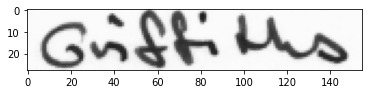

In [ ]:
ninth_word = words_list[8]
roi_9 = img[ninth_word[1]:ninth_word[3], ninth_word[0]:ninth_word[2]]
print(ninth_word)
plt.imshow(roi_9);

In [ ]:
import pandas as pd

df = pd.DataFrame (words_list, columns = ['x', 'y','h','w'])


In [ ]:
df.nunique()

x    46
y    37
h    49
w    37
dtype: int64

In [ ]:
df = df.sort_values(['x'])


In [ ]:
img.shape

(481, 1000, 3)

In [ ]:
imgs=[]

In [ ]:
df=df.drop_duplicates()

In [ ]:
df.shape

(56, 4)

In [ ]:
for index, row in df.iterrows():
    print(row['y'], row['w'],row['x'],row['h'])
    roi_9 = img[row['y']:row['w'], row['x']:row['h']]
    plt.imshow(roi_9);
    imgs.append(roi_9)




In [ ]:
for index, row in df.iterrows():
  # print(row['c1'], row['c2'])
  #ninth_word[1]:ninth_word[3], ninth_word[0]:ninth_word[2]
  #print(row[y])
  # print(y)
  # print(row[w])
  # print(row[x])
  # print(row[h])
  try:
    roi_9 = img[row['y']:row['w'], row['x']:row['h']]
  except:
    continue
  print(ninth_word)
  plt.imshow(img);


In [ ]:
ninth_word = words_list[101

                        ]

In [ ]:
ninth_word

[502, 367, 640, 387]

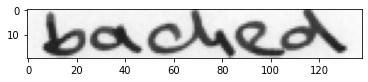

In [ ]:
roi_9 = img[ninth_word[1]:ninth_word[3], ninth_word[0]:ninth_word[2]]

plt.imshow(roi_9);

In [ ]:
roi_9.shape

(25, 57, 3)

In [ ]:
words_list.sort()

In [ ]:
from google.colab.patches import cv2_imshow
#cv2_imshow(imgs[1])


(28, 155, 3)

TypeError: ignored

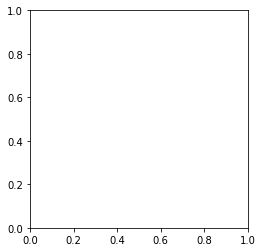

In [ ]:
plt.imshow(sample)

In [ ]:
roi_9.shape

(22, 98, 3)

In [ ]:
import numpy as np


gray = cv2. cvtColor(roi_9, cv2. COLOR_BGR2GRAY)
gray.shape



(44, 207)

In [ ]:
sample=process_image(gray)

In [ ]:
sample.shape

(32, 128, 1)

In [ ]:
import keras
act_model=keras.models.load_model('/content/drive/MyDrive/FYP/LSTM/model3.h5',compile = False)
a=act_model.input[0]
b=act_model.get_layer('dense')
Model2=Model(inputs=a,outputs=b.output)

NameError: ignored

In [ ]:
img=sample
img=tf.expand_dims(img, axis=0)
prediction = Model2.predict(img)
decoded = K.ctc_decode(prediction,
                               input_length=np.ones(prediction.shape[0]) * prediction.shape[1],
                               greedy=True)[0][0]
out = K.get_value(decoded)
char_list = "!\"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"

for i, x in enumerate(out):
    print("predicted text = ", end = '')
    for p in x:
        if int(p) != -1:
            s=char_list[int(p)]
            print(s)



predicted text = n
o
m
i
n
a
t
i
n
g


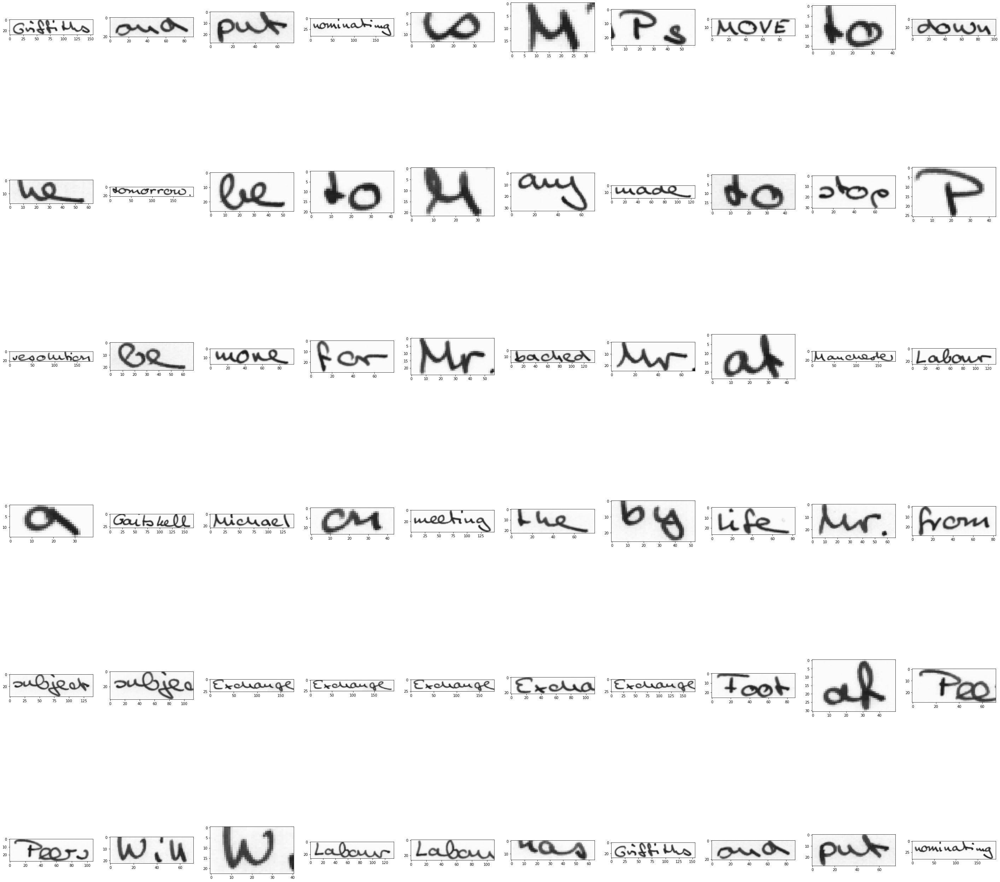

In [ ]:
_, axs = plt.subplots(6, 10, figsize=(50, 50))
axs = axs.flatten()
for img2, ax in zip(imgs, axs):
    ax.imshow(img2)
plt.show()


In [ ]:
import cv2

image = cv2.imread('/content/a01-000u (1).png')
original = image.copy()

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)
canny = cv2.Canny(blur, 120, 255, 1)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9,9))
dilate = cv2.dilate(canny, kernel, iterations=5)
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 5000
image_number = 0
for c in cnts:
    area = cv2.contourArea(c)
    if area > min_area:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)
        ROI = original[y:y+h, x:x+w]
        cv2.imwrite("/content/drive/MyDrive/FYP/yes/ROI_{}.png".format(image_number), ROI)
        image_number += 1

cv2_imshow( blur)
cv2_imshow( dilate)
cv2_imshow( canny)
cv2_imshow( image)
cv2.waitKey(0)

In [ ]:
import cv2
import numpy as np

# read input image
img = cv2.imread('/content/1.png')

# convert img to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# otsu threshold
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU )[1]
thresh = 255 - thresh

# apply morphology close to form rows
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (51,1))
morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

# find contours and bounding boxes of rows
rows_img = img.copy()
boxes_img = img.copy()
rowboxes = []
rowcontours = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
rowcontours = rowcontours[0] if len(rowcontours) == 2 else rowcontours[1]
index = 1
for rowcntr in rowcontours:
    xr,yr,wr,hr = cv2.boundingRect(rowcntr)
    cv2.rectangle(rows_img, (xr, yr), (xr+wr, yr+hr), (0, 0, 255), 1)
    rowboxes.append((xr,yr,wr,hr))

# sort rowboxes on y coordinate
def takeSecond(elem):
    return elem[1]
rowboxes.sort(key=takeSecond)

# loop over each row
for rowbox in rowboxes:
    # crop the image for a given row
    xr = rowbox[0]
    yr = rowbox[1]
    wr = rowbox[2]
    hr = rowbox[3]
    row = thresh[yr:yr+hr, xr:xr+wr]
    bboxes = []
    # find contours of each character in the row
    contours = cv2.findContours(row, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]
    for cntr in contours:
        x,y,w,h = cv2.boundingRect(cntr)
        bboxes.append((x+xr,y+yr,w,h))
    # sort bboxes on x coordinate
    def takeFirst(elem):
        return elem[0]
    bboxes.sort(key=takeFirst)
    # draw sorted boxes
    for box in bboxes:
        xb = box[0]
        yb = box[1]
        wb = box[2]
        hb = box[3]
        cv2.rectangle(boxes_img, (xb, yb), (xb+wb, yb+hb), (0, 0, 255), 1)
        cv2.putText(boxes_img, str(index), (xb,yb), cv2.FONT_HERSHEY_COMPLEX_SMALL, 0.75, (0,255,0), 1)
        index = index + 1

# save result
cv2.imwrite("vision78_thresh.jpg", thresh)
cv2.imwrite("vision78_morph.jpg", morph)
cv2.imwrite("vision78_rows.jpg", rows_img)
cv2.imwrite("vision78_boxes.jpg", boxes_img)

# show images
cv2_imshow( thresh)
cv2_imshow( morph)
cv2_imshow( rows_img)
cv2_imshow( boxes_img)
cv2.waitKey(0)

In [ ]:
#!/usr/bin/python3
# 2018.01.16 01:11:49 CST
# 2018.01.16 01:55:01 CST
import cv2
import numpy as np

## (1) read
img = cv2.imread("/content/1.png")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

## (2) threshold
th, threshed = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV|cv2.THRESH_OTSU)

## (3) minAreaRect on the nozeros
pts = cv2.findNonZero(threshed)
ret = cv2.minAreaRect(pts)

(cx,cy), (w,h), ang = ret
if w>h:
    w,h = h,w
    ang += 90

## (4) Find rotated matrix, do rotation
M = cv2.getRotationMatrix2D((cx,cy), ang, 1.0)
rotated = cv2.warpAffine(threshed, M, (img.shape[1], img.shape[0]))

## (5) find and draw the upper and lower boundary of each lines
hist = cv2.reduce(rotated,1, cv2.REDUCE_AVG).reshape(-1)

th = 2
H,W = img.shape[:2]
uppers = [y for y in range(H-1) if hist[y]<=th and hist[y+1]>th]
lowers = [y for y in range(H-1) if hist[y]>th and hist[y+1]<=th]

rotated = cv2.cvtColor(rotated, cv2.COLOR_GRAY2BGR)
for y in uppers:
    cv2.line(rotated, (0,y), (W, y), (255,0,0), 1)

for y in lowers:
    cv2.line(rotated, (0,y), (W, y), (0,255,0), 1)

cv2.imwrite("result.png", rotated)


True

In [ ]:
import cv2
import numpy as np

def process_img(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_canny = cv2.Canny(img_gray, 100, 100)
    kernel = np.ones((2, 3))
    img_dilate = cv2.dilate(img_canny, kernel, iterations=1)
    img_erode = cv2.erode(img_dilate, kernel, iterations=1)
    return img_erode

def get_centeroid(cnt):
    length = len(cnt)
    sum_x = np.sum(cnt[..., 0])
    sum_y = np.sum(cnt[..., 1])
    return int(sum_x / length), int(sum_y / length)

def get_centers(img):
    contours, hierarchies = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    for cnt in contours:
        if cv2.contourArea(cnt) > 100:
            yield get_centeroid(cnt)

def get_rows(img, centers, row_amt, row_h):
    centers = np.array(centers)
    d = row_h / row_amt
    for i in range(row_amt):
        f = centers[:, 1] - d * i
        a = centers[(f < d) & (f > 0)]
        yield a[a.argsort(0)[:, 0]]

img = cv2.imread("/content/1.png")
img_processed = process_img(img)
centers = list(get_centers(img_processed))

h, w, c = img.shape
count = 0

for row in get_rows(img, centers, 4, h):
    cv2.polylines(img, [row], False, (255, 0, 255), 2)
    for x, y in row:
        count += 1
        cv2.circle(img, (x, y), 10, (0, 0, 255), -1)
        cv2.putText(img, str(count), (x - 10, y + 5), 1, cv2.FONT_HERSHEY_PLAIN, (0, 255, 255), 2)

cv2_imshow( img)
cv2.waitKey(0)

In [ ]:
import cv2
import numpy as np

original_image=cv2.imread("/content/1.png")
image=original_image#cv2.cvtColor(original_image,cv2.COLOR_BGR2GRAY)



ret,image=cv2.threshold(image,70,255,0)


#cv2.imshow("image",image)


contours,hierarchy=cv2.findContours(image,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)


sorted_contours=sorted(contours,key=cv2.contourArea,reverse=False)[:3]


for i,cnt in enumerate(sorted_contours):

    m=cv2.moments(cnt)
    cx=int(m["m10"]/m["m00"])
    cy=int(m["m01"]/m["m00"])


    cv2.drawContours(original_image,[cnt],-1,(200,100,0),3)
    cv2.putText(original_image,str(i+1),(cx,cy),cv2.FONT_HERSHEY_SIMPLEX,1,(255,200,0),1)

    cv2.imshow("sorted",original_image)
    cv2.waitKey()
#cv2.imshow("original_image",original_image)
cv2.waitKey()
cv2.destroyAllWindows()


error: ignored

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(35,35))

# dilate the image to get text
# binaryContour is just the black and white image shown below
dilation = cv2.dilate(binaryContour,kernel,iterations = 2)

NameError: ignored

In [ ]:
#python -m
!pip install -U pandas


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
def get_contour_precedence(contour, cols):
    origin = cv2.boundingRect(contour)
    return origin[1] * cols + origin[0]

In [ ]:
import cv2

def get_contour_precedence(contour, cols):
    tolerance_factor = 1000
    origin = cv2.boundingRect(contour)
    return ((origin[1] // tolerance_factor) * tolerance_factor) * cols + origin[0]

img = cv2.imread("/content/1.png", 0)

_, img = cv2.threshold(img, 70, 255, cv2.THRESH_BINARY_INV)

contours, heirarchy = cv2.findContours(img.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

#a=sorted(contours,)
# sorted_contours_lines = sorted(contours, key =lambda x:get_contour_precedence(x, img.shape[1])) # (
# contours.sort()
contours.sort(key=lambda x:get_contour_precedence(x, img.shape[1]))
from past.builtins import xrange

# For debugging purposes.
for i in xrange(len(contours)):
    img = cv2.putText(img, str(i), cv2.boundingRect(contours[i])[:2], cv2.FONT_HERSHEY_COMPLEX, 1, [125])

In [ ]:
img.shape

(1193, 2479)

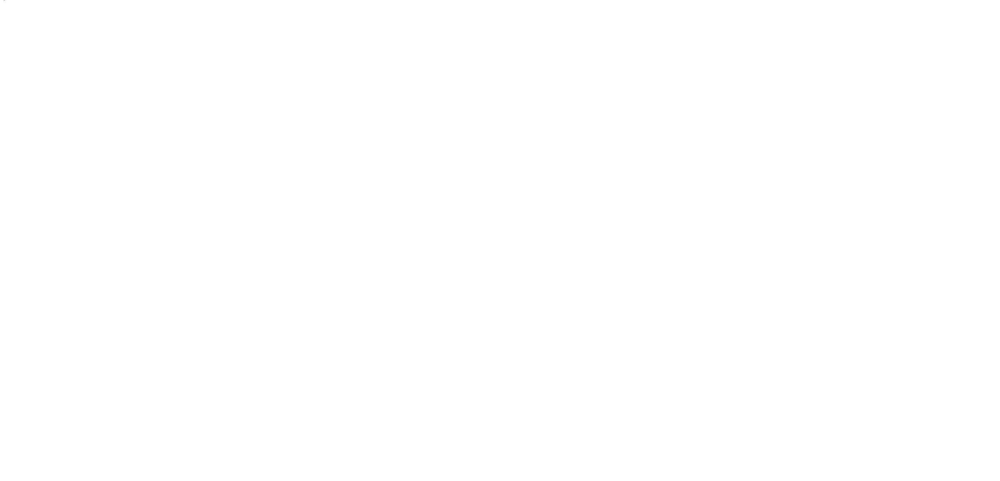

In [ ]:
cv2_imshow(img)

In [ ]:
len(contours)

419

In [ ]:
words_list=[]

for word in contours:


    x2, y2, w2, h2 = cv2.boundingRect(word)
    words_list.append([x+x2, y+y2, x+x2+w2, y+y2+h2])
    cv2.rectangle(img3, (x+x2, y+y2), (x+x2+w2, y+y2+h2), (255,255,100),2)


In [ ]:
words_list

[[123, 0, 2602, 1193]]

In [ ]:
ninth_word = words_list
roi_9 = img[ninth_word[1]:ninth_word[3], ninth_word[0]:ninth_word[2]]
print(ninth_word)
plt.imshow(roi_9);

IndexError: ignored

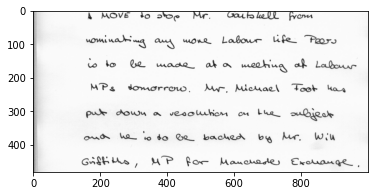

In [ ]:
img = cv2.imread('/content/1.png')
img2=img.copy()
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

h, w, c = img.shape

if w > 1000:

    new_w = 1000
    ar = w/h
    new_h = int(new_w/ar)

    img = cv2.resize(img, (new_w, new_h), interpolation = cv2.INTER_AREA)
plt.imshow(img);

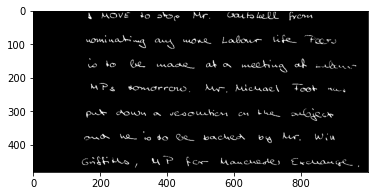

In [ ]:
def thresholding(image):
    img_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    ret,thresh = cv2.threshold(img_gray,80,255,cv2.THRESH_BINARY_INV)
    plt.imshow(thresh, cmap='gray')
    return thresh

thresh_img = thresholding(img);

In [ ]:
import math

In [ ]:
contours, hierarchy = cv2.findContours(thresh_img,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

points = []
for cnt in contours:
    x,y,w,h=cv2.boundingRect(cnt)

    points.append((x,y,w,h))

#print(points)
points = sorted(points,key=lambda data:math.sqrt(data[1]**2+data[0]**2));

In [ ]:
points[0]

(165, 8, 10, 19)

In [ ]:
cv2.__version__

'4.1.2'

In [ ]:
ninth_word = points[7]
x=ninth_word[1]
w=ninth_word[3]
y=ninth_word[0]
h=ninth_word[2]

roi_9 = img[x:(x+w),y:(y+h)]
print(ninth_word)
cv2_imshow(roi_9);
print(img.shape)

(215, 87, 6, 10)


(481, 1000, 3)


In [ ]:
roi_9

array([], shape=(2, 0, 3), dtype=uint8)

In [ ]:
img.shape

(481, 1000, 3)

In [ ]:
top=514
right=430
height= 40
width=100
croped_image = image[top : (top + height) , right: (right + width)]
plt.imshow(croped_image, cmap="gray")
plt.show()

In [ ]:
x=points[0][1]
w=points[0][3]
y=points[0][0]
h=points[0][2]
roi_9 = img[x:(x+w),y:(y+h)]


In [ ]:
print(x)
print(w)
print(y)
print(h)


8
19
165
10


In [ ]:
cv2_imshow(roi_9);


In [ ]:
def process_img(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3,3), 0)
    canny = cv2.Canny(blur, 120, 255, 1)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13,13))
    dilate = cv2.dilate(canny, kernel, iterations=5)
    img_erode = cv2.erode(dilate, kernel, iterations=1)

#    cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # img_canny = cv2.Canny(img_gray, 120, 225,1)
    # kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9,9))
    # img_dilate = cv2.dilate(img_canny, kernel, iterations=5)
    # img_erode = cv2.erode(img_dilate, kernel, iterations=1)
    return img_erode


def get_centeroid(cnt):
    length = len(cnt)
    sum_x = np.sum(cnt[..., 0])
    sum_y = np.sum(cnt[..., 1])
    return int(sum_x / length), int(sum_y / length)
words_list = []
def get_centers(img):
    contours, hierarchies = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        if cv2.contourArea(cnt) > 100:
            x2, y2, w2, h2 = cv2.boundingRect(cnt)
            words_list.append([x2, y2, x2+w2, y2+h2])
            yield get_centeroid(cnt)


def get_rows(img, centers, row_amt, row_h):
    centers = np.array(centers)
    d = row_h / row_amt
    for i in range(row_amt):
        f = centers[:, 1] - d * i
        a = centers[(f < d) & (f > 0)]
        yield a[a.argsort(0)[:, 0]]


In [ ]:
img = cv2.imread('/content/a01-043x.png')
copy=img.copy()
img_processed = process_img(img)
centers = list(get_centers(img_processed))

h, w, c = img.shape
count = 0

for row in get_rows(img, centers, 20, h):
    cv2.polylines(img, [row], False, (255, 0, 255), 2)
    for x, y in row:
        count += 1
        cv2.circle(img, (x, y), 10, (0, 0, 255), -1)
        cv2.putText(img, str(count), (x - 10, y + 5), 1, cv2.FONT_HERSHEY_PLAIN, (0, 255, 255), 2)

#cv2_imshow(img)
#cv2.waitKey(0)
copy = cv2.cvtColor(copy, cv2.COLOR_BGR2GRAY)




In [ ]:
cv2_imshow(img)

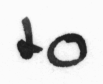

In [ ]:

ninth_word = words_list[-10]
roi_9 = copy[ninth_word[1]:ninth_word[3], ninth_word[0]:ninth_word[2]]
cv2_imshow(roi_9)

In [ ]:
import cv2
import numpy as np
#import image
image = cv2.imread('/content/1.png')
#cv2.imshow('orig',image)
#cv2.waitKey(0)

#grayscale
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
cv2.waitKey(0)

#binary
ret,thresh = cv2.threshold(gray,127,255,cv2.THRESH_BINARY_INV)
cv2_imshow(thresh)
cv2.waitKey(0)

#dilation
kernel = np.ones((5,5), np.uint8)
img_dilation = cv2.dilate(thresh, kernel, iterations=1)
cv2_imshow(img_dilation)
cv2.waitKey(0)

#find contours
ctrs, hier = cv2.findContours(img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#sort contours
sorted_ctrs = sorted(ctrs, key=lambda ctr: cv2.boundingRect(ctr)[0])

for i, ctr in enumerate(sorted_ctrs):
    # Get bounding box
    x, y, w, h = cv2.boundingRect(ctr)

    # Getting ROI
    roi = image[y:y+h, x:x+w]

    # show ROI
    cv2_imshow(roi)
    cv2.rectangle(image,(x,y),( x + w, y + h ),(90,0,255),2)
    cv2.waitKey(0)

cv2_imshow(image)
cv2.waitKey(0)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


In [ ]:
img = cv2.imread('/content/IMG_20220225_105552.jpg')

# convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# blur
blur = cv2.GaussianBlur(gray, (0,0), sigmaX=33, sigmaY=33)

# divide
divide = cv2.divide(gray, blur, scale=255)

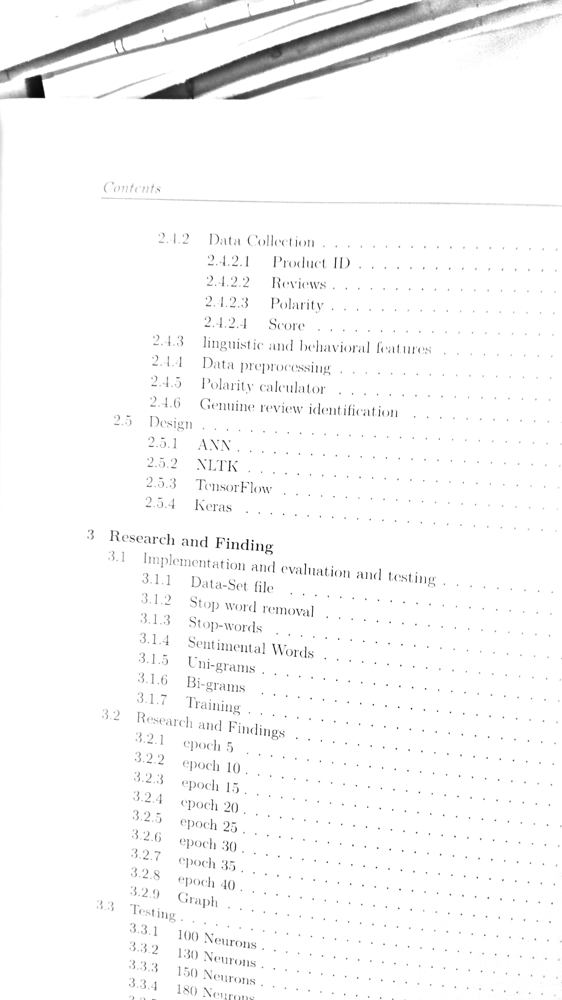

In [ ]:
cv2_imshow(divide)

In [ ]:
img=divide

In [ ]:
divide.shape

(4160, 2340)

In [ ]:
divide.shape

(4160, 2340)

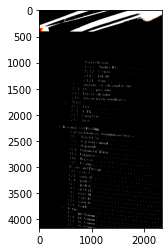

In [ ]:
def thresholding(image):
    img_gray = image
    ret,thresh = cv2.threshold(img_gray,80,255,cv2.THRESH_BINARY_INV)
    plt.imshow(thresh, cmap='gray')
    return thresh

thresh_img = thresholding(img);

In [ ]:
thresh_img.shape

(4160, 2340, 3)

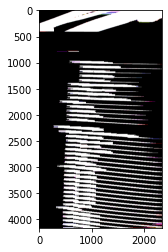

In [ ]:
#dilation
kernel = np.ones((3,200), np.uint8)
dilated = cv2.dilate(thresh_img, kernel, iterations = 1)
plt.imshow(dilated, cmap='gray');

In [ ]:
dilated.shape

(4160, 2340, 3)

In [ ]:
dilated2=cv2.cvtColor(dilated,cv2.COLOR_BGR2GRAY)

In [ ]:
cv2_imshow(dilated2)

In [ ]:
(contours, heirarchy) = cv2.findContours(dilated2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
sorted_contours_lines = sorted(contours, key = lambda ctr : cv2.boundingRect(ctr)[1]) # (x, y, w, h)

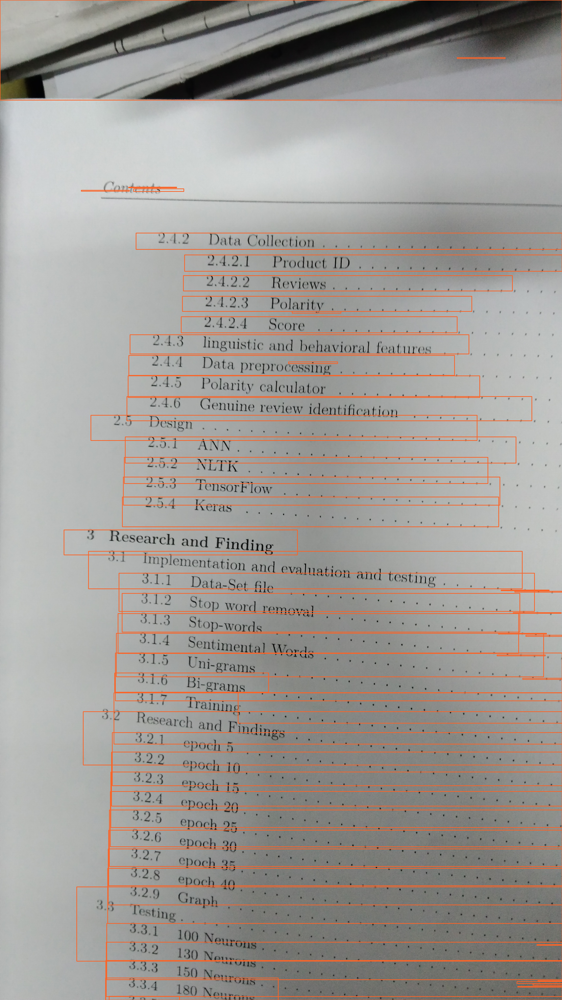

In [ ]:
img2 = img.copy()

for ctr in sorted_contours_lines:
  x,y,w,h = cv2.boundingRect(ctr)
  # if (w   < img.shape[0]/2):
  #   print(w)
  #   continue;

  cv2.rectangle(img2, (x,y), (x+w, y+h), (40, 100, 250), 2)


cv2_imshow(img2);

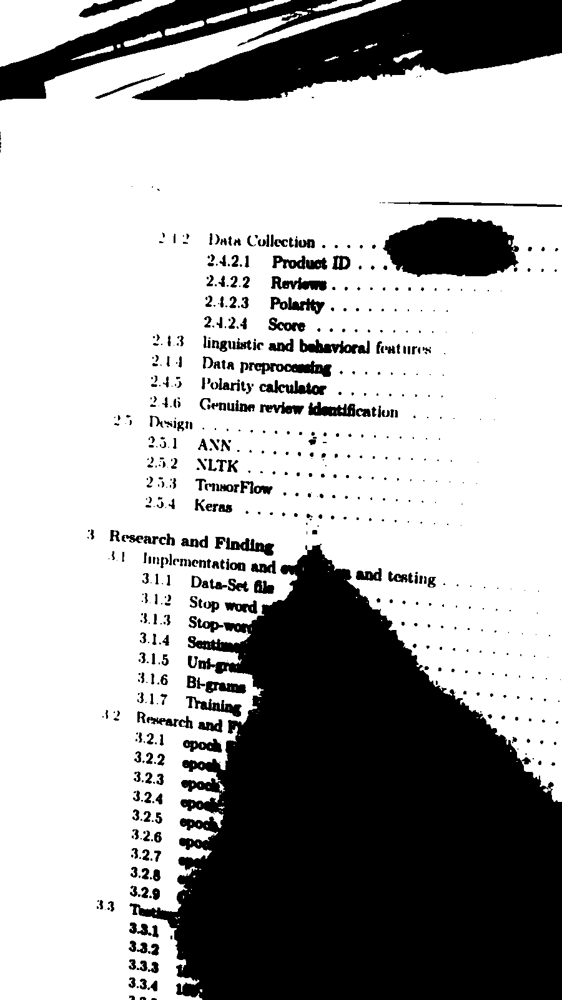

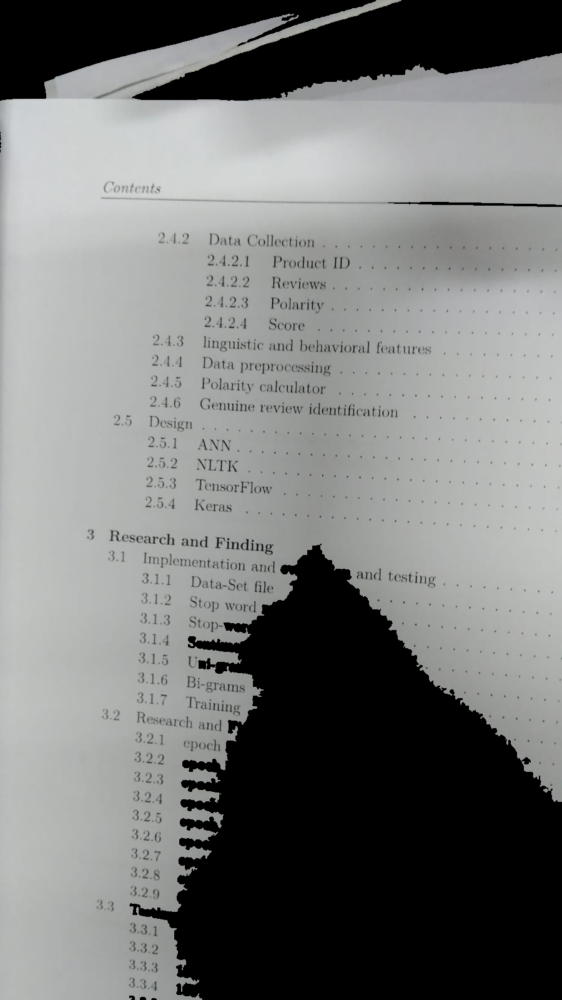

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

def rotate_image(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result

img = cv2.imread("/content/WhatsApp Image 2022-02-27 at 12.30.19 PM (1).jpeg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mask = np.zeros((img.shape[0], img.shape[1]))
blur = cv2.GaussianBlur(gray, (5,5),0)
ret, thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
cv2_imshow(thresh)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
largest_countour = max(contours, key = cv2.contourArea)
binary_mask = cv2.drawContours(mask, [largest_countour], 0, 1, -1)
new_img = img * np.dstack((binary_mask, binary_mask, binary_mask))
minRect = cv2.minAreaRect(largest_countour)
rotate_angle = minRect[-1] if minRect[-1] < 0 else -minRect[-1]
new_img = rotate_image(new_img, rotate_angle)
cv2_imshow(new_img)

In [ ]:
import cv2
import numpy as np

# Read image and search for contours.
img = cv2.imread('/content/IMG_20220225_105535.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, threshold = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(threshold,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)

# Create first mask used for rotation.
mask = np.ones(img.shape, np.uint8)*255

# Draw contours on the mask with size and ratio of borders for threshold.
for cnt in contours:
    size = cv2.contourArea(cnt)
    x,y,w,h = cv2.boundingRect(cnt)
    if 10000 > size > 500 and w*2.5 > h:
        cv2.drawContours(mask, [cnt], -1, (0,0,0), -1)

# Connect neighbour contours and select the biggest one (text).
kernel = np.ones((50,50),np.uint8)
opening = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
gray_op = cv2.cvtColor(opening, cv2.COLOR_BGR2GRAY)
_, threshold_op = cv2.threshold(gray_op, 150, 255, cv2.THRESH_BINARY_INV)
contours_op, hierarchy_op = cv2.findContours(threshold_op, cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
cnt = max(contours_op, key=cv2.contourArea)

# Create rotated rectangle to get the angle of rotation and the 4 points of the rectangle.
_, _, angle = rect = cv2.minAreaRect(cnt)
(h,w) = img.shape[:2]
(center) = (w//2,h//2)

# Rotate the image.
M = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated = cv2.warpAffine(img, M, (int(w),int(h)), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_CONSTANT)

# Create bounding box for rotated text (use old points of rotated rectangle).
box = cv2.boxPoints(rect)
a, b, c, d = box = np.int0(box)
bound =[]
bound.append(a)
bound.append(b)
bound.append(c)
bound.append(d)
bound = np.array(bound)
(x1, y1) = (bound[:,0].min(), bound[:,1].min())
(x2, y2) = (bound[:,0].max(), bound[:,1].max())
cv2.drawContours(img,[box],0,(0,0,255),2)

# Crop the image and create new mask for the final image.
rotated = rotated[y1:y2, x1:x2]
mask_final = np.ones(rotated.shape, np.uint8)*255

# Remove noise from the final image.
gray_r = cv2.cvtColor(rotated, cv2.COLOR_BGR2GRAY)
_, threshold_r = cv2.threshold(gray_r, 150, 255, cv2.THRESH_BINARY_INV)
contours, hierarchy = cv2.findContours(threshold_r,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
for cnt in contours:
    size = cv2.contourArea(cnt)
    if size < 500:
        cv2.drawContours(threshold_r, [cnt], -1, (0,0,0), -1)

# Invert black and white.
final_image = cv2.bitwise_not(threshold_r)

# Display results.
cv2_imshow( final_image)
cv2_imshow( rotated)

In [ ]:
import cv2
import numpy as np
#import image
image = cv2.imread('/content/1.png')
#cv2.imshow('orig',image)
#cv2.waitKey(0)

#grayscale
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
cv2.waitKey(0)

#binary
ret,thresh = cv2.threshold(gray,127,255,cv2.THRESH_BINARY_INV)
cv2_imshow(thresh)
cv2.waitKey(0)

#dilation
kernel = np.ones((25,25), np.uint8)
img_dilation = cv2.dilate(thresh, kernel, iterations=1)
cv2_imshow(img_dilation)
cv2.waitKey(0)

#find contours
ctrs, hier = cv2.findContours(img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#sort contours
sorted_ctrs = sorted(ctrs, key=lambda ctr: cv2.boundingRect(ctr)[0])

for i, ctr in enumerate(sorted_ctrs):
    # Get bounding box
    x, y, w, h = cv2.boundingRect(ctr)

    # Getting ROI
    roi = image[y:y+h, x:x+w]

    # show ROI
    cv2_imshow(roi)
    cv2.rectangle(image,(x,y),( x + w, y + h ),(90,0,255),2)
    cv2.waitKey(0)

cv2_imshow(image)
cv2.waitKey(0)

In [ ]:
import cv2
import numpy as np
#import image
image = cv2.imread('/content/a01-043x.png')
#cv2.imshow('orig',image)
#cv2.waitKey(0)

kernel = np.ones((5,5),np.uint8)
opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)



#grayscale
gray = cv2.cvtColor(opening,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
cv2.waitKey(0)

#binary
ret,thresh = cv2.threshold(gray,127,255,cv2.THRESH_BINARY_INV)
cv2_imshow(thresh)
cv2.waitKey(0)

#dilation
kernel = np.ones((5,150), np.uint8)
img_dilation = cv2.dilate(thresh, kernel, iterations=1)
cv2_imshow(img_dilation)
cv2.waitKey(0)

#find contours
ctrs, hier = cv2.findContours(img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


In [ ]:
sorted_ctrs = sorted(ctrs, key=lambda ctr: cv2.boundingRect(ctr)[1])
for j in range(0,len(sorted_ctrs)):
  x, y, w, h = cv2.boundingRect(sorted_ctrs[j])

  # Getting ROI
  roi = image[y:y+h, x:x+w]

  # show ROI
  cv2_imshow(roi)
  cv2.rectangle(image,(x,y),( x + w, y + h ),(90,0,255),2)

In [ ]:
import cv2
import numpy as np

# read image
img = cv2.imread('/content/1.png')

# blur
blur = cv2.GaussianBlur(img, (3,3), 0)

# convert to hsv and get saturation channel
sat = cv2.cvtColor(blur, cv2.COLOR_BGR2HSV)[:,:,1]

# threshold saturation channel
thresh = cv2.threshold(sat, 50, 255, cv2.THRESH_BINARY)[1]

# apply morphology close and open to make mask
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9,9))
morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
mask = cv2.morphologyEx(morph, cv2.MORPH_OPEN, kernel, iterations=1)

# do OTSU threshold to get circuit image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

# write black to otsu image where mask is black
otsu_result = otsu.copy()
otsu_result[mask==0] = 0

# write black to input image where mask is black
img_result = img.copy()
img_result[mask==0] = 0

# write result to disk
cv2.imwrite("circuit_board_mask.png", mask)
cv2.imwrite("circuit_board_otsu.png", otsu)
cv2.imwrite("circuit_board_otsu_result.png", otsu_result)
cv2.imwrite("circuit_board_img_result.png", img_result)


# display it
cv2_imshow( img)
cv2_imshow( sat)
cv2_imshow( mask)
cv2_imshow( otsu)
cv2_imshow(otsu_result)
cv2_imshow(img_result)
cv2.waitKey(0)
